In [216]:
import sys
sys.path.insert(0, '..')

In [217]:
# Basic imports
import jax.numpy as np
import jax.random as jr
import jax.scipy as jsp
import jax
import numpy

jax.config.update("jax_enable_x64", True)

# Optimisation imports
import zodiax as zdx
import optax

# dLux imports
import dLux as dl
import dLux.utils as dlu

jax.config.update("jax_enable_x64", True)


import chainconsumer as cc

import numpyro as npy
import numpyro.distributions as dist
from numpyro.infer.reparam import LocScaleReparam

# Visualisation imports
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import matplotlib

plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 72

from detectors import *
from apertures import *
from models import *
from fisher import *
from stats import posterior

%matplotlib inline
plt.rcParams['image.cmap'] = 'inferno'
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = 'lower'
plt.rcParams['figure.dpi'] = 72
plt.rcParams["font.size"] = 24

def set_array(pytree):
    dtype = np.float64 if jax.config.x64_enabled else np.float32
    floats, other = eqx.partition(pytree, eqx.is_inexact_array_like)
    floats = jtu.tree_map(lambda x: np.array(x, dtype=dtype), floats)
    return eqx.combine(floats, other)

In [218]:
wid = 64
oversample = 4

optics = NICMOSOptics(512, wid, oversample)

detector = NICMOSDetector(oversample, wid)


ddir = "../data/MAST_2024-09-08T07_59_18.213Z/"
fname = ddir + 'HST/n43ca5feq_cal.fits'

ddir = "../data/MAST_2024-09-22T03_37_01.724Z/HST/"


exposures = [

    #exposure_from_file(ddir + 'n8yj02wyq_cal.fits', SinglePointFit(), crop=wid),
    #exposure_from_file(ddir + 'n8yj02x0q_cal.fits', SinglePointFit(), crop=wid),

    exposure_from_file(fname, SinglePointFit(), crop=wid),
    #exposure_from_file(ddir + 'n8yj53vfq_cal.fits', SinglePointFit(), crop=wid),
    #exposure_from_file(ddir + 'n8yj03tiq_cal.fits', SinglePointFit(), crop=wid),

]

Filename: ../data/MAST_2024-09-08T07_59_18.213Z/HST/n43ca5feq_cal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     305   ()      
  1  SCI           1 ImageHDU       143   (256, 256)   float32   
  2  ERR           1 ImageHDU        71   (256, 256)   float32   
  3  DQ            1 ImageHDU        71   (256, 256)   int16   
  4  SAMP          1 ImageHDU        71   (256, 256)   int16   
  5  TIME          1 ImageHDU        71   (256, 256)   float32   
None


In [219]:
exposures[0].filter

'F190N'

In [220]:
y,x = numpy.unravel_index(numpy.nanargmax(exposures[0].data),exposures[0].data.shape)
print(x,y)

32 31


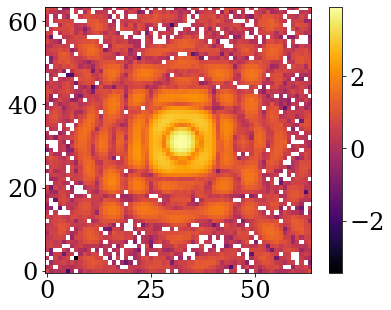

In [221]:
plt.imshow(np.log10(exposures[0].data/exposures[0].err))
plt.colorbar()

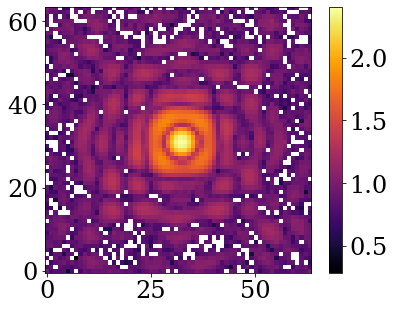

In [222]:
plt.imshow(exposures[0].data**0.125)
plt.colorbar()

In [223]:
params = {
    "fluxes": {},
    "positions": {},
    "slope": {},
    "aberrations": {},
    #"breathing": {},
    "cold_mask_shift": {},
    "cold_mask_rot": {},
    "cold_mask_scale": {},
    "cold_mask_shear": {},
    "primary_scale": {},
    "primary_rot": {},
    "primary_shear": {},
    "outer_radius": 1.2*0.955,
    "secondary_radius": 0.372*1.2,
    "spider_width": 0.077*1.2,
    "scale": 0.0432,
    "rot": 0.,
    "softening": 2.
}

for exp in exposures:
    params["positions"][exp.fit.get_key(exp, "positions")] = np.asarray([0.,0.])
    params["fluxes"][exp.fit.get_key(exp, "fluxes")] = np.log10(np.nansum(exp.data))
    params["slope"][exp.fit.get_key(exp, "slope")] = np.zeros(5)#.at[0].set(1)
    params["aberrations"][exp.fit.get_key(exp, "aberrations")] = np.zeros(26)
    #params["breathing"][exp.fit.get_key(exp, "breathing")] = np.zeros(19) + 0.1
    #params["start_aberrations"][exp.fit.get_key(exp, "start_aberrations")] = np.zeros(19)#jr.uniform(jr.key(0), (8,),minval=-4e-8, maxval=4e-8) #np.asarray([-8.59023084e-10,  1.77049982e-09, -4.45293089e-09, -3.70890613e-08,2.03658617e-08,  1.08092528e-08, -2.77077727e-09,  1.86458672e-09])*0.9#jr.uniform(jr.key(0), (8,),minval=-2e-8, maxval=2e-8)#np.zeros(8)#np.ones(8)*1e-8
    #params["end_aberrations"][exp.fit.get_key(exp, "start_aberrations")] = np.zeros(19)
    params["cold_mask_shift"][exp.fit.get_key(exp, "cold_mask_shift")] = np.asarray([0.06, 0.06])*1e2
    params["cold_mask_rot"][exp.fit.get_key(exp, "cold_mask_rot")] = -45.
    params["cold_mask_scale"][exp.fit.get_key(exp, "cold_mask_scale")] = np.asarray([1.,1.])
    params["cold_mask_shear"][exp.fit.get_key(exp, "cold_mask_shear")] = np.asarray([0.,0.])
    params["primary_rot"][exp.fit.get_key(exp, "primary_rot")] = -45. #+ 180.
    params["primary_scale"][exp.fit.get_key(exp, "primary_scale")] = np.asarray([1.,1.])
    params["primary_shear"][exp.fit.get_key(exp, "primary_shear")] = np.asarray([0.,0.])

model = set_array(NICMOSModel(exposures, params, optics, detector))

params = ModelParams(params)

In [224]:
params

ModelParams(
  params={
    'fluxes':
    {'F190N': f64[]},
    'positions':
    {'n43ca5feq': f64[2]},
    'slope':
    {'F190N': f64[5]},
    'aberrations':
    {'n43ca5feq': f64[26]},
    'cold_mask_shift':
    {'F190N': f64[2]},
    'cold_mask_rot':
    {'F190N': -45.0},
    'cold_mask_scale':
    {'F190N': f64[2]},
    'cold_mask_shear':
    {'F190N': f64[2]},
    'primary_scale':
    {'F190N': f64[2]},
    'primary_rot':
    {'F190N': -45.0},
    'primary_shear':
    {'F190N': f64[2]},
    'outer_radius':
    1.146,
    'secondary_radius':
    0.44639999999999996,
    'spider_width':
    0.0924,
    'scale':
    0.0432,
    'rot':
    0.0,
    'softening':
    2.0
  }
)

In [225]:
print(params.params)

{'fluxes': {'F190N': Array(4.48266956, dtype=float64)}, 'positions': {'n43ca5feq': Array([0., 0.], dtype=float64)}, 'slope': {'F190N': Array([0., 0., 0., 0., 0.], dtype=float64)}, 'aberrations': {'n43ca5feq': Array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0.], dtype=float64)}, 'cold_mask_shift': {'F190N': Array([6., 6.], dtype=float64)}, 'cold_mask_rot': {'F190N': -45.0}, 'cold_mask_scale': {'F190N': Array([1., 1.], dtype=float64)}, 'cold_mask_shear': {'F190N': Array([0., 0.], dtype=float64)}, 'primary_scale': {'F190N': Array([1., 1.], dtype=float64)}, 'primary_rot': {'F190N': -45.0}, 'primary_shear': {'F190N': Array([0., 0.], dtype=float64)}, 'outer_radius': 1.146, 'secondary_radius': 0.44639999999999996, 'spider_width': 0.0924, 'scale': 0.0432, 'rot': 0.0, 'softening': 2.0}


In [226]:
def scheduler(lr, start, *args):
    shed_dict = {start: 1e10}
    for start, mul in args:
        shed_dict[start] = mul
    return optax.piecewise_constant_schedule(lr / 1e10, shed_dict)

base_sgd = lambda vals: optax.sgd(vals, nesterov=True, momentum=0.6)

opt = lambda lr, start, *schedule: base_sgd(scheduler(lr, start, *schedule))

base_adam = lambda vals: optax.adam(vals)
opta = lambda lr, start, *schedule: base_adam(scheduler(lr, start, *schedule))


def flatten(l):
    if isinstance(l, (tuple, list)):
         return [a for i in l for a in flatten(i)]
    else:
        return [l]



g = 1e-2

things = {
    "fluxes" : opt(g*20,10),
    "positions": opt(g*10, 0),
    "cold_mask_shift": opt(g*100, 120),
    "cold_mask_rot": opt(g*100, 120),
    #"cold_mask_scale": opt(g*1000, 150),
    #"cold_mask_shear": opt(g*10, 150),
    #"primary_scale": opt(g*100, 150),
    #"primary_rot": opt(g*100, 150),
    #"primary_shear": opt(g*100, 150),
    "aberrations": opt(g*1,120),
    "slope": opt(g*200, 20),
    #"softening": opt(g*1e3, 200),
    #"breathing": opt(g*1000,150),
    #"rot": opt(g*100, 50),
}

groups = list(things.keys())
paths = flatten(groups)
optimisers = [things[i] for i in groups]
groups = [list(x) if isinstance(x, tuple) else x for x in groups]

In [227]:
@zdx.filter_jit
@zdx.filter_value_and_grad(paths)
def loss_fn(params,exposures):
    mdl = params.inject(model)
    return np.nansum(np.asarray([posterior(mdl,exposure) for exposure in exposures]))


In [228]:
rc = False
fishers = calc_fishers(model, exposures, paths, recalculate=rc)
lrs = calc_lrs(model, exposures, fishers, paths)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

In [229]:
fishers

{'n43ca5feq': {'fluxes': Array([[3.06759384e+09]], dtype=float64),
  'positions': Array([[1.14459289e+08, 1.35121365e+07],
         [1.35121365e+07, 1.13358473e+08]], dtype=float64),
  'cold_mask_shift': Array([[-398946.00889871,   55374.34625455],
         [  55374.34625455, -399391.55198429]], dtype=float64),
  'cold_mask_rot': Array([[-732387.88925041]], dtype=float64),
  'aberrations': Array([[ 7.20136812e+01, -5.29205246e+02, -4.06790880e+01,
           3.68770506e+02, -3.74997830e+02,  5.43418692e+01,
           4.74435543e+01,  2.15704838e+02,  3.41937916e+01,
          -1.49979775e+02,  9.73136197e+01,  1.58242773e+01,
          -3.71825559e+02,  3.74942480e+02, -1.77245101e+02,
          -1.71490167e+02,  1.10763437e+02, -1.02833119e+02,
           2.55232982e+02,  1.60948220e+02, -8.97717223e+00,
          -6.78424302e+00,  8.90177257e+00, -5.29740522e+01,
           2.21637783e+00, -1.27405175e+02],
         [-5.29205246e+02, -6.62876259e+02,  2.14774162e+01,
          -2.43

In [230]:
lrs.params

{'aberrations': {'n43ca5feq': Array([-0.01388625,  0.00150858,  0.00159609, -0.00075138, -0.000787  ,
         -0.0006262 , -0.00061931, -0.00390401, -0.05976935,  0.01166451,
          0.0070751 ,  0.0042609 , -0.00147333, -0.00148727, -0.00085829,
         -0.00087182, -0.00404927, -0.00393901,  0.00353803,  0.00442042,
          0.00469707,  0.00375736,  0.00587892,  0.00577849,  0.00458099,
         -0.01884594], dtype=float64)},
 'cold_mask_rot': {'F190N': Array(1.36539669e-06, dtype=float64)},
 'cold_mask_scale': {'F190N': None},
 'cold_mask_shear': {'F190N': None},
 'cold_mask_shift': {'F190N': Array([2.50660485e-06, 2.50380859e-06], dtype=float64)},
 'fluxes': {'F190N': Array(-3.25988397e-10, dtype=float64)},
 'outer_radius': None,
 'positions': {'n43ca5feq': Array([-8.73673083e-09, -8.82157258e-09], dtype=float64)},
 'primary_rot': {'F190N': None},
 'primary_scale': {'F190N': None},
 'primary_shear': {'F190N': None},
 'rot': None,
 'scale': None,
 'secondary_radius': None,
 's

In [231]:
model

NICMOSModel(
  params={
    'aberrations':
    {'n43ca5feq': f64[26]},
    'cold_mask_rot':
    {'F190N': f64[]},
    'cold_mask_scale':
    {'F190N': f64[2]},
    'cold_mask_shear':
    {'F190N': f64[2]},
    'cold_mask_shift':
    {'F190N': f64[2]},
    'fluxes':
    {'F190N': f64[]},
    'outer_radius':
    f64[],
    'positions':
    {'n43ca5feq': f64[2]},
    'primary_rot':
    {'F190N': f64[]},
    'primary_scale':
    {'F190N': f64[2]},
    'primary_shear':
    {'F190N': f64[2]},
    'rot':
    f64[],
    'scale':
    f64[],
    'secondary_radius':
    f64[],
    'slope':
    {'F190N': f64[5]},
    'softening':
    f64[],
    'spider_width':
    f64[]
  },
  filters={'F190N': f64[83,2]},
  optics=NICMOSOptics(
    wf_npixels=512,
    diameter=f64[],
    layers={
      'CompoundAperture':
      CompoundAperture(
        normalise=True,
        transformation=CoordTransform(
          translation=None,
          rotation=f64[],
          compression=None,
          shear=None
    

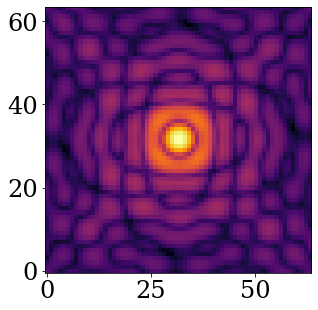

In [232]:
plt.imshow(exposures[0].fit(model,exposures[0])**0.125)

In [233]:
optim, opt_state = zdx.get_optimiser(
    params, groups, optimisers
)


losses, models = [], []
for i in tqdm(range(250)):
    loss, grads = loss_fn(params,exposures)
    grads = jtu.tree_map(lambda x, y: x * np.abs(y), grads, ModelParams(lrs.params))
    updates, opt_state = optim.update(grads, opt_state)
    params = zdx.apply_updates(params, updates)
    
    #if i == 200:
    #    params.set("softening", 0.2)

    models.append(params)
    losses.append(loss)


  0%|          | 0/250 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
#model


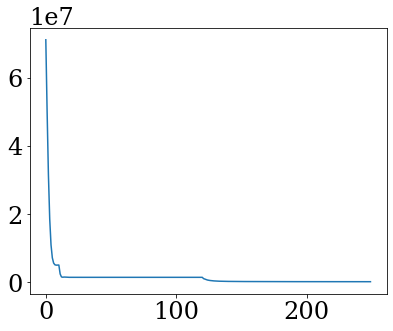

In [ ]:
plt.plot(losses[:])

6


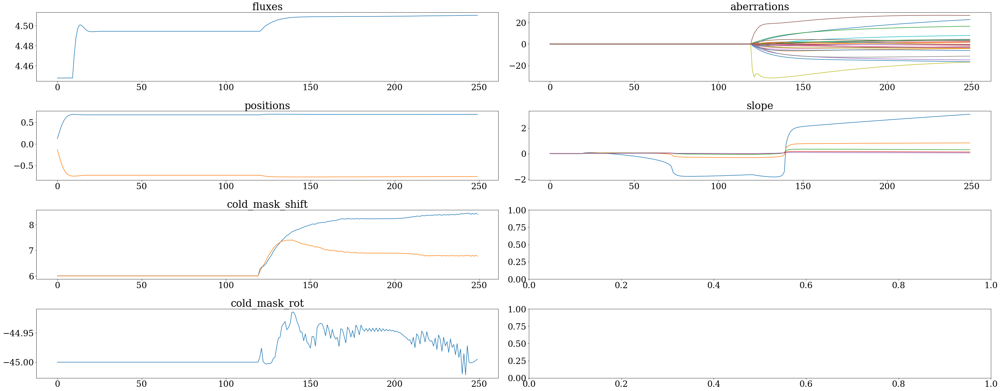

In [ ]:
xw = 4
yw = int(np.ceil(len(groups)/xw))

print(len(groups))


fig, axs = plt.subplots(xw,yw,figsize=(xw*10,yw*8))
for i, param in enumerate(groups):
    #print(param)
    sp = axs[i%xw, i//xw]
    if param in ["fluxes", "contrast", "positions", "aberrations", 
                 "cold_mask_shift", "cold_mask_rot", "cold_mask_scale", "cold_mask_shear",
                 "primary_rot","primary_scale", "primary_shear", "breathing", "slope"]:
        #print(np.asarray(list(models_s[0].get(param).values())))
        #print(injected_params[param])
        """for j in injected_params[param].values():
            print(j)
            print(len(j.shape))
            if len(j.shape)>0:
                for k in j:
                    sp.axhline(k, color='k', linestyle='--')
            else:
                sp.axhline(j, color='k', linestyle='--')"""
        for p in np.asarray([np.asarray(list(x.get(param).values())) for x in models]).T:
            if len(p.shape)>1:
                for i in range(p.shape[0]):
                    sp.plot(p[i,:])
            else:
                sp.plot(p)
            sp.set_title(param)
    else:
        sp.set_title(param)
        sp.plot([x.get(param) for x in models])
        #sp.axhline(injected_params[param], color='k', linestyle='--')

    
fig.tight_layout()

In [ ]:
#for exp in exposures:
#    params = params.set("aberrations."+exp.fit.get_key(exp, "aberrations"), -params.get("aberrations."+exp.fit.get_key(exp, "aberrations")))

7.109664e+07, 1.805451e+05


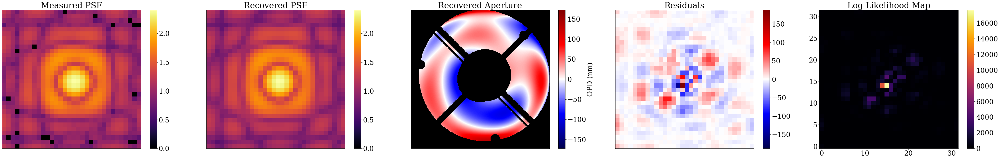

In [ ]:
print(f"{float(losses[0]):e}, {float(losses[-1]):e}")

fig, axs = plt.subplots(1,5, figsize=(50,8))

fig.tight_layout()

cmap = matplotlib.colormaps['inferno']
cmap.set_bad('k',1)

#vm = max(np.max(cropped_data),np.max(telescope.model()))

exp = exposures[0]


model = params.inject(model)

coords = dlu.pixel_coords(512, 2.4)
cropped_frame = exp.data**0.125
telescope_frame = exp.fit(model,exp)**0.125

vm = max(np.nanmax(cropped_frame),np.nanmax(telescope_frame))
cd=axs[0].imshow(cropped_frame, vmin=0,vmax=vm,cmap=cmap)
plt.colorbar(cd,ax=axs[0])
tl=axs[1].imshow(telescope_frame, vmin=0, vmax=vm,cmap=cmap)
plt.colorbar(tl,ax=axs[1])
#axs[2].imshow(cropped_err)
cmap = matplotlib.colormaps['seismic']
cmap.set_bad('k',1)

#start_aberrations = model.get(exp.fit.map_param(exp, "start_aberrations"))#*1e-9
#end_aberrations = model.get(exp.fit.map_param(exp, "end_aberrations"))#*1e-9

#aberrations_model = model.set(exp.map_param("aberrations"), (start_aberrations+end_aberrations)/2)

optics = exp.fit.update_optics(model, exp)

support = optics.transmission(coords,2.4/512)
support_mask = support.at[support < .5].set(np.nan)

opd = optics.AberratedAperture.eval_basis(coords)*1e9
olim = np.max(np.abs(opd))
apt =axs[2].imshow(support_mask*opd,cmap=cmap,vmin=-olim, vmax=olim)
plt.colorbar(apt, ax=axs[2]).set_label("OPD (nm)")
#axs[4].imshow(telescope.detector.pixel_response.pixel_response)
resid = (exp.data - exp.fit(model,exp))/exp.err
rlim = np.nanmax(np.abs(resid))
resid=axs[3].imshow(resid, cmap='seismic',vmin=-rlim, vmax=rlim)
plt.colorbar(resid,ax=axs[3])

lpdf = posterior(model,exp,return_im=True)#*nanmap
lpd = axs[4].imshow(lpdf)
plt.colorbar(lpd, ax=axs[4])

axs[0].set_title("Measured PSF")
axs[1].set_title("Recovered PSF")
axs[2].set_title("Recovered Aperture")
axs[3].set_title("Residuals")
axs[4].set_title("Log Likelihood Map")

for i in range(4):
    axs[i].set_xticks([])
    axs[i].set_yticks([])

#axs[1].imshow(telescope.optics.aberrations.eval_basis(coords)*1e9)
plt.show()
#plt.imshow(np.abs(telescope.model()-cropped_data)**0.25)


In [ ]:
potato

In [ ]:
params.aberrations

{'n43ca5feq': Array([ 22.76909245,   1.62315666,  -3.86671041,  -3.57393662,
        -14.80710163,  -2.52094822,  -3.04399961, -11.26665081,
        -16.76543229,   7.91013146, -16.5169863 ,  -4.30816845,
         16.58703785,   1.9786596 ,   4.40261053,   2.87371506,
         -3.49859279,   3.45604318,  -3.86979937,  -0.65576584,
         -6.08625006,  -0.20159173,   4.0448543 ,  -1.16360714,
         -0.54886263,  26.5771952 ], dtype=float64)}

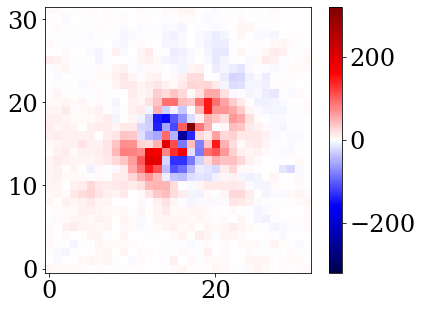

In [ ]:
resid = (exp.data - exp.fit(model,exp))/exp.err

bresid = resid.at[28:36, 28:36].set(0)
vm = np.nanmax(np.abs(bresid))
plt.imshow(bresid, cmap='seismic', vmin=-vm, vmax=vm)

#print(np.nanmedian(np.abs(resid[50:-50,50:-50])))
#plt.imshow((np.abs(resid[50:-50,50:-50])))
plt.colorbar()

In [ ]:
rc = True
fishers = calc_fishers(model, exposures, paths, recalculate=rc)


  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/11 [00:00<?, ?it/s]

In [ ]:
params.get(exposures[0].map_param("aberrations"))[0]

Array(0.02341074, dtype=float64)

In [ ]:
params.params["fluxes"]

{'F110W': Array(3.44668657, dtype=float64)}

In [ ]:
np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['aberrations'])))[0][0]

Array(0.37516899, dtype=float64)

In [ ]:
names = [dlu.zernike_name(x) for x in range(40)]

sample: 100%|██████████| 1000/1000 [56:18<00:00,  3.38s/it, 15 steps of size 3.55e-01. acc. prob=0.85] 



                     mean       std    median      5.0%     95.0%     n_eff     r_hat
    2nd Astig X     36.77      0.81     36.75     35.50     38.04    934.93      1.00
    2nd Astig Y     20.27      0.81     20.30     18.90     21.53    446.75      1.00
     2nd Coma X     22.14      0.86     22.18     20.87     23.65    643.80      1.00
     2nd Coma Y    -51.81      0.80    -51.82    -53.32    -50.69    752.71      1.00
  2nd Spherical    -82.27      0.59    -82.25    -83.21    -81.33    684.29      1.00
  2nd Trefoil X     64.50      0.93     64.52     63.04     66.02    750.62      1.00
  2nd Trefoil Y     24.98      0.89     25.00     23.62     26.47   1390.01      1.00
    3rd Astig X     32.27      0.57     32.26     31.40     33.20    574.93      1.00
    3rd Astig Y    -47.84      0.71    -47.85    -48.96    -46.75    754.80      1.00
     3rd Coma X    -35.30      0.47    -35.30    -36.13    -34.63    747.52      1.00
     3rd Coma Y     17.55      0.54     17.54     16.

Parameter 2nd Astig X in chain numpyro chain is not constrained
Parameter 2nd Coma X in chain numpyro chain is not constrained
Parameter 2nd Trefoil X in chain numpyro chain is not constrained
Parameter 3rd Astig X in chain numpyro chain is not constrained
Parameter 3rd Astig Y in chain numpyro chain is not constrained
Parameter 4th Coma X in chain numpyro chain is not constrained
Parameter Astig X in chain numpyro chain is not constrained
Parameter Coma X in chain numpyro chain is not constrained
Parameter Coma Y in chain numpyro chain is not constrained
Parameter Hexafoil Y in chain numpyro chain is not constrained
Parameter Pentafoil Y in chain numpyro chain is not constrained
Parameter Trefoil Y in chain numpyro chain is not constrained


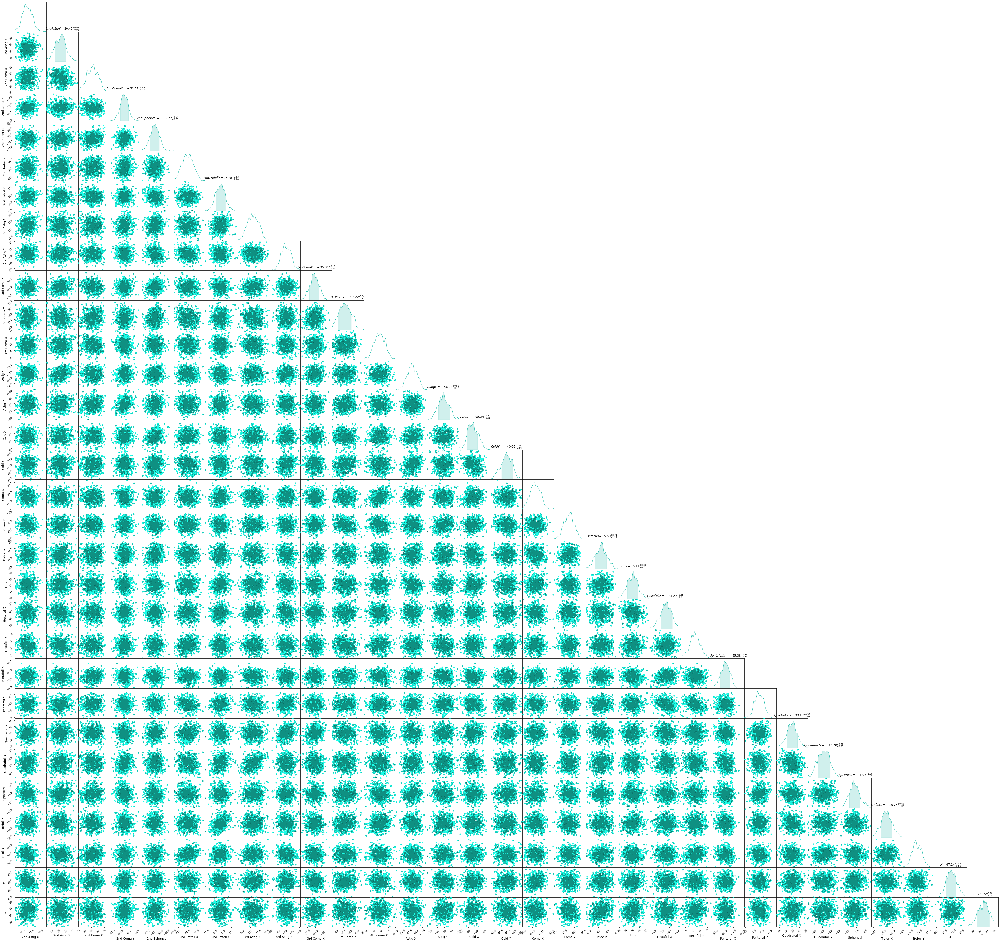

In [ ]:

def make_psf_model(modelparams, fishers):

    def psf_model(data, model):

        params = {
            "fluxes": {},
            "positions": {},
            "cold_mask_shift": {},
            "aberrations": {},
        }

        for exp in exposures:
            params["fluxes"][exp.fit.get_key(exp, "fluxes")] = npy.sample("Flux", dist.Normal(0,1))*np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['fluxes'])))[0][0] + modelparams.get(exp.map_param("fluxes"))#*1e5
            params["cold_mask_shift"][exp.fit.get_key(exp, "cold_mask_shift")] = np.asarray([npy.sample("Cold X", dist.Normal(0, 1))*np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['cold_mask_shift'])))[0][0] + modelparams.get(exp.map_param("cold_mask_shift"))[0], npy.sample("Cold Y", dist.Normal(0, 1))*np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['cold_mask_shift'])))[1][1] + modelparams.get(exp.map_param("cold_mask_shift"))[1]])
            params["positions"][exp.fit.get_key(exp, "positions")] = np.asarray([npy.sample("X", dist.Normal(0,1))*np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['positions'])))[0][0] + modelparams.get(exp.map_param("positions"))[0], npy.sample("Y", dist.Normal(0, 1))*np.sqrt(np.abs(np.linalg.inv(fishers['n8yj53vfq']['positions'])))[1][1] + modelparams.get(exp.map_param("positions"))[1]])

            params["aberrations"][exp.fit.get_key(exp, "aberrations")] = np.asarray([
                npy.sample(names[x], dist.Normal(0,1))/np.sqrt(fishers['n8yj53vfq']['aberrations'][i][i]) + modelparams.get(exp.map_param("aberrations"))[i] for i, x in enumerate(range(4,30))
                
            ])

        params = ModelParams(params)

        
        
        with npy.plate("data", size=len(data.data.flatten())):

            mdl = params.inject(model)
            model_data = data.fit(mdl, data).flatten()
            img, err, bad = data.data.flatten(), data.err.flatten(), data.bad.flatten()
            image = np.where(bad, 0, img)
            error = np.where(bad, 1e5, err)
            
            image_d = dist.Normal(image, error)
            return npy.sample("psf", image_d, obs=np.where(bad,0,model_data))
    
    return psf_model



sampler = npy.infer.MCMC(
    npy.infer.NUTS(make_psf_model(params, jtu.tree_map(lambda x: np.abs(x), fishers)), 
                   init_strategy=npy.infer.init_to_sample,
                    dense_mass=False),
    num_warmup=500,
    num_samples=500,
    #num_chains=6,
    #chain_method='vectorized'
    progress_bar=True,
)

sampler.run(jr.PRNGKey(0),exposures[0], model)

sampler.print_summary()

chain = cc.Chain.from_numpyro(sampler, name="numpyro chain", color="teal")
consumer = cc.ChainConsumer().add_chain(chain)
#consumer = consumer.add_truth(cc.Truth(location={"X":-3e-7/pixel_scale, "Y":1e-7/pixel_scale, "Flux":5,"Cold X":0.08, "Cold Y":0.08, "Defocus":5, "Cold Rot":np.pi/4}))

fig = consumer.plotter.plot()
#fig.savefig("chains_hmc_data.png")
#plt.close()

plt.show()